In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
from pybads import BADS
from scipy.optimize import minimize
from scipy.stats import wilcoxon
from joblib import Parallel, delayed
from sklearn.linear_model import LinearRegression
from temp_norm import simulate, wrap_simulate_sousa, wrap_simulate_eshel, get_psth
from discrete_models import unexpec_resp_mse, out_sub_mse, out_sub_resp, out_div_mse, out_div_resp, in_sub_mse, in_div_mse
from tests import discounting_model_test, discounting_psth_test, sousa_R2
from graph_neurons import plot_all_neurons

## Optimization

In [2]:
def fit_neuron(neuron, raw_df, seed=0, get_n=False, shuffle=False, baseline=True, constrain_W=False, skip_sensory=False, suppress=True):
    psth = get_psth(raw_df, neuron, shuffle=shuffle)

    if baseline and not constrain_W:
        start = np.array([5, 2, 10, 10, 1, 2, 2, 2, 2, 5, .05, .01])
        lower = np.array([2, .0001, 3, 3, .00001, .001, .001, .001, .001, .001, .00001, .00001])
        upper = np.array([20, 50, 150, 100, 10, 10, 10, 10, 10, 20, 1, 1])
    elif not baseline and constrain_W:
        start = np.array([5, 2, 10, 10, 1, 2, 5, 5])
        lower = np.array([2, .0001, 3, 3, .00001, .001, .001, .00001])
        upper = np.array([20, 50, 150, 100, 10, 10, 20, 20])
    elif not baseline and not constrain_W and suppress:
        start = np.array([5, 2, 10, 10, 1, 2, 2, 2, 2, 5, 5])
        lower = np.array([2, .0001, 3, 3, .00001, .001, .001, .001, .001, .001, .00001])
        upper = np.array([20, 50, 150, 100, 10, 10, 10, 10, 10, 20, 20])
    elif not baseline and not constrain_W and not suppress:
        start = np.array([5, 2, 10, 1, 2, 2, 2, 2, 5, 5])
        lower = np.array([2, .0001, 3, .00001, .001, .001, .001, .001, .001, .00001])
        upper = np.array([20, 50, 150, 10, 10, 10, 10, 10, 20, 20])
    else:
        raise ValueError("Invalid combination of baseline and constrain_W")

    bads = BADS(lambda x: wrap_simulate_sousa(x, psth, baseline=baseline, constrain_W=constrain_W, skip_sensory=skip_sensory, suppress=suppress), 
                   start, 
                   lower_bounds=lower, 
                   upper_bounds=upper,
                   options={"display": "off", "random_seed": seed}) 
                   
    min_res = bads.optimize()
    
    if shuffle:
        return {"min_res": min_res, "psth": psth}
    return {"min_res": min_res}

## Data

In [2]:
data_file = "../../Data/28390151/Raw/Neurons_behavior_trials_with_PSTH.csv" # data from the Sousa et al. (2025) repository
raw_df = pd.read_csv(data_file)
r = 4.5 # fixed reward amount for the trials with variable timing
neurons = raw_df[(raw_df["Distribution reward ID"] == 0) & (raw_df["Amount reward"] == r) & (raw_df["Is photo ided"] == 1) & (raw_df["Type of neuron"] == "Putative_DA")]["Neuron id"].unique()
neurons.sort()
neurons = neurons[15:] # first 15 neurons are from the mouse missing the 0-delay data

## Fit the full model

In [10]:
num_seeds = 10 # run the optimization ten times and choose the best result
cand_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed) for i in range(neurons.shape[0]))
    cand_results.append(cur_results)

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [11]:
results = [] # optimization result
errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the ten optimization runs
    min_error = wrap_simulate_sousa(cand_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i]))
    min_result = cand_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i]))
        if cur_error < min_error:
            min_result = cand_results[cur_seed][i]
            min_error = cur_error

    results.append(min_result)
    errors.append(min_error)

In [13]:
params = [results[i]["min_res"].x for i in range(len(results))]

with open("fits/saved_params_actual_.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_actual.pkl", "wb") as errors_file:
    pickle.dump(errors, errors_file) 

In [3]:
# alternatively, can load previously saved fits rather than fitting from scratch
with open("fits/saved_params_actual.pkl", "rb") as param_file:
    saved_params = pickle.load(param_file)

with open("fits/saved_errors_actual.pkl", "rb") as param_file:
    saved_errors = pickle.load(param_file)

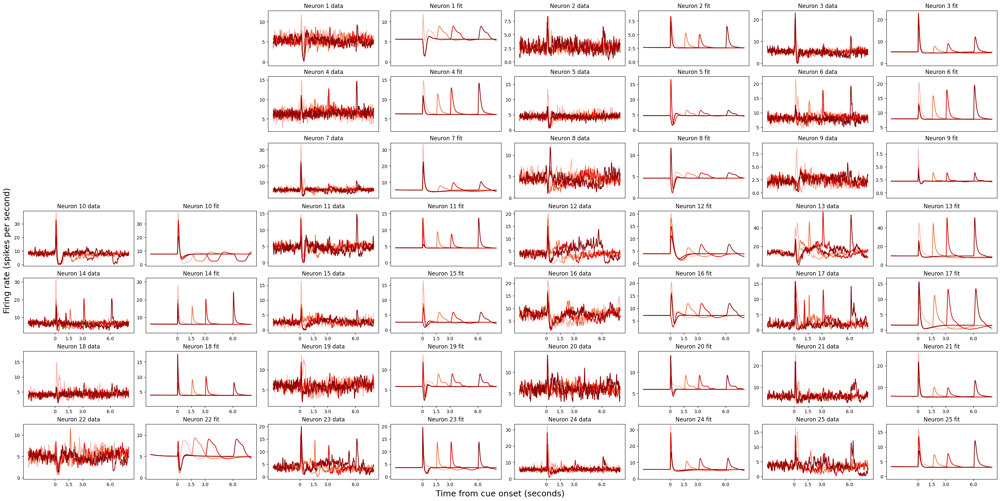

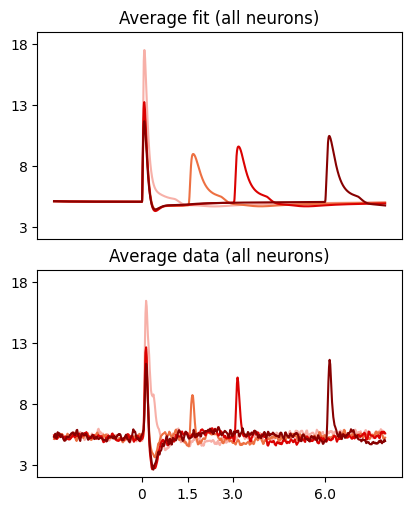

In [15]:
plot_all_neurons(saved_params, neurons, raw_df, "all_fits.svg", "avg_graphs.svg")

In [16]:
discounting_model_test(saved_params)

(np.float64(0.018341034650802612), np.float64(0.011824965476989746))

In [4]:
discounting_psth_test(raw_df, neurons)

(np.float64(0.03335079550743103), np.float64(0.0004559457302093506))

In [4]:
sousa_R2(saved_params, raw_df, neurons)

(0.6252778780476165,
 np.float64(69874.00065020335),
 0.9827756076215933,
 np.float64(92.65539804465683))

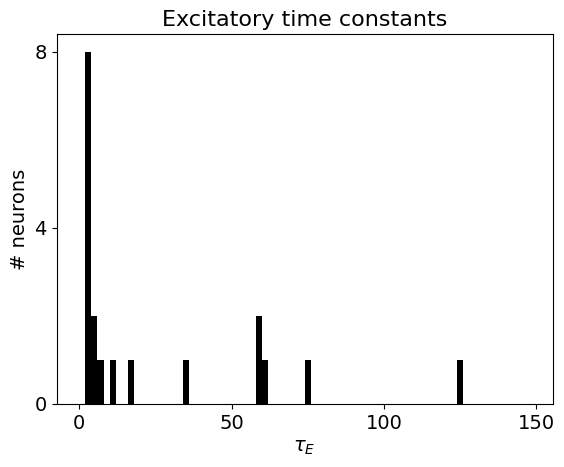

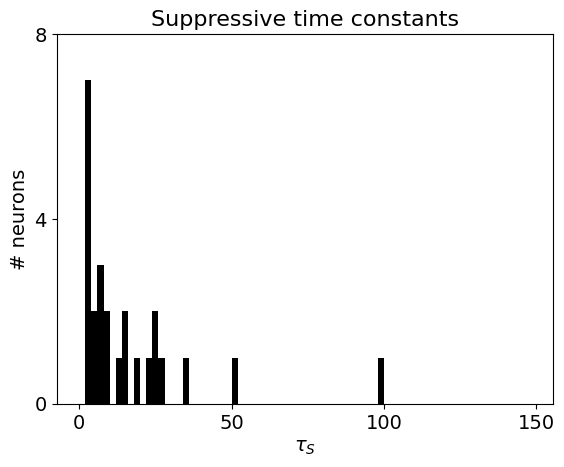

In [18]:
# histograms of time constants

tau_Es = [param_set[2] for param_set in saved_params]
tau_Ss = [param_set[3] for param_set in saved_params]

plt.hist(np.array(tau_Es), bins=np.arange(0, 75)*2, color="k")
plt.xticks([0, 50, 100, 150], fontsize=14)
plt.yticks([0, 4, 8], fontsize=14)
plt.xlabel("$τ_E$", fontsize=14)
plt.ylabel("# neurons", fontsize=14)
plt.title("Excitatory time constants", fontsize=16)
plt.savefig("tauE_hist.svg", bbox_inches="tight")
plt.show()

plt.hist(np.array(tau_Ss), bins=np.arange(0, 75)*2, color="k")
plt.xticks([0, 50, 100, 150], fontsize=14)
plt.yticks([0, 4, 8], fontsize=14)
plt.xlabel("$τ_S$", fontsize=14)
plt.ylabel("# neurons", fontsize=14)
plt.title("Suppressive time constants", fontsize=16)
plt.savefig("tauS_hist.svg", bbox_inches="tight")
plt.show()

## Fit to shuffled data

In [18]:
num_seeds = 10
cand_shuff_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed, shuffle=True) for i in range(neurons.shape[0]))
    cand_shuff_results.append(cur_results)

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [19]:
shuff_results = [] # optimization result
shuff_errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the ten optimization runs
    min_error = wrap_simulate_sousa(cand_shuff_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i], shuffle=True))
    min_result = cand_shuff_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_shuff_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i], shuffle=True))
        if cur_error < min_error:
            min_result = cand_shuff_results[cur_seed][i]
            min_error = cur_error

    shuff_results.append(min_result)
    shuff_errors.append(min_error)

In [23]:
params = [shuff_results[i]["min_res"].x for i in range(len(shuff_results))]

with open("fits/saved_params_shuffled.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_shuffled.pkl", "wb") as errors_file:
    pickle.dump(shuff_errors, errors_file) 

In [5]:
with open("fits/saved_params_shuffled.pkl", "rb") as paramfile:
    shuff_params = pickle.load(paramfile)
    
with open("fits/saved_errors_shuffled.pkl", "rb") as errorfile:
    shuff_errors = pickle.load(errorfile)

In [6]:
for i in range(len(shuff_errors)):
    print(saved_errors[i], shuff_errors[i])

10.353231874125546 10.30694049078329
2.989645245747441 4.424828668001341
15.321718707912853 22.586329622700113
7.549395295207106 11.681426864203516
14.154715986611562 14.094646402048623
13.754308409837641 20.134611708440772
16.69360718331392 21.61242056445959
29.604278353444478 66.06769752777235
3.3426774065955085 3.6293304625081904
26.46010583402256 26.549040276340484
34.68303201561395 61.68726295772849
36.98973343922732 49.894035893636534
162.37973894204515 197.27728886071475
57.913861138048965 48.94875270484133
6.022793008839901 6.277698448658133
45.27563198304189 45.283927766356484
9.984378591183726 8.4014259591605
38.38402465788527 39.38161008145163
11.328192721419292 11.323649731510331
5.748112766486497 5.7164910567044265
13.175456722279646 22.75407520699712
34.06732667205439 35.526233052389
14.707249404701424 14.723777316573578
13.786869508113089 15.299259907323002
9.137503217104696 18.43702510302188


In [7]:
print(np.mean(saved_errors), np.mean(shuff_errors))
wilcoxon(saved_errors, shuff_errors, alternative="less")

25.352303563394553 31.28079146537302


WilcoxonResult(statistic=np.float64(49.0), pvalue=np.float64(0.0007263720035552979))

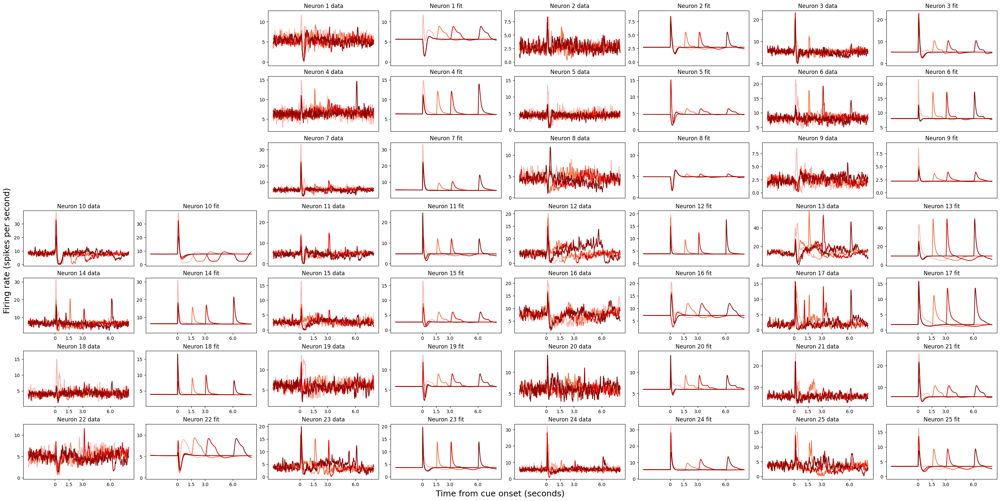

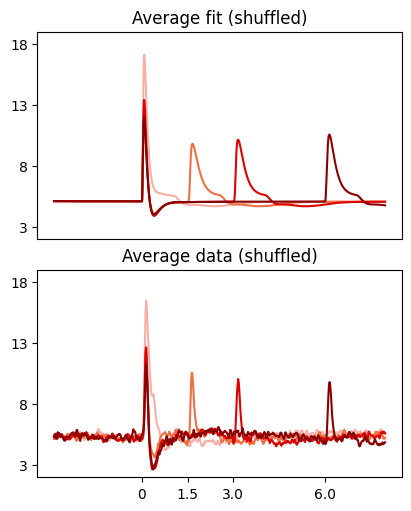

In [8]:
plot_all_neurons(shuff_params, neurons, raw_df, "shuffled_fits.svg", "avg_shuffled.svg", avg_description=" (shuffled)", shuffle=True)

In [9]:
discounting_model_test(shuff_params)

(np.float64(0.024131208658218384), np.float64(0.12605196237564087))

In [6]:
discounting_psth_test(raw_df, neurons, shuffle=True)

(np.float64(0.9218308925628662), np.float64(0.5940348207950592))

In [6]:
sousa_R2(shuff_params, raw_df, neurons, shuffle=True)

(0.6305169132717605,
 np.float64(69108.06076933567),
 0.9738150063385688,
 np.float64(176.42738703453685))

## Fits without baseline

In [8]:
num_seeds = 5 # run the optimization five times and choose the best result
cand_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed, baseline=False) for i in range(neurons.shape[0]))
    cand_results.append(cur_results)

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [9]:
results = [] # optimization result
errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the five optimization runs
    min_error = wrap_simulate_sousa(cand_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False)
    min_result = cand_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False)
        if cur_error < min_error:
            min_result = cand_results[cur_seed][i]
            min_error = cur_error

    results.append(min_result)
    errors.append(min_error)

In [13]:
params = [results[i]["min_res"].x for i in range(len(results))]

with open("fits/saved_params_no-baseline.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_no-baseline.pkl", "wb") as errors_file:
    pickle.dump(errors, errors_file) 

In [7]:
with open("fits/saved_params_no-baseline.pkl", "rb") as paramfile:
    simple_params = pickle.load(paramfile)
    
with open("fits/saved_errors_no-baseline.pkl", "rb") as errorfile:
    simple_errors = pickle.load(errorfile)

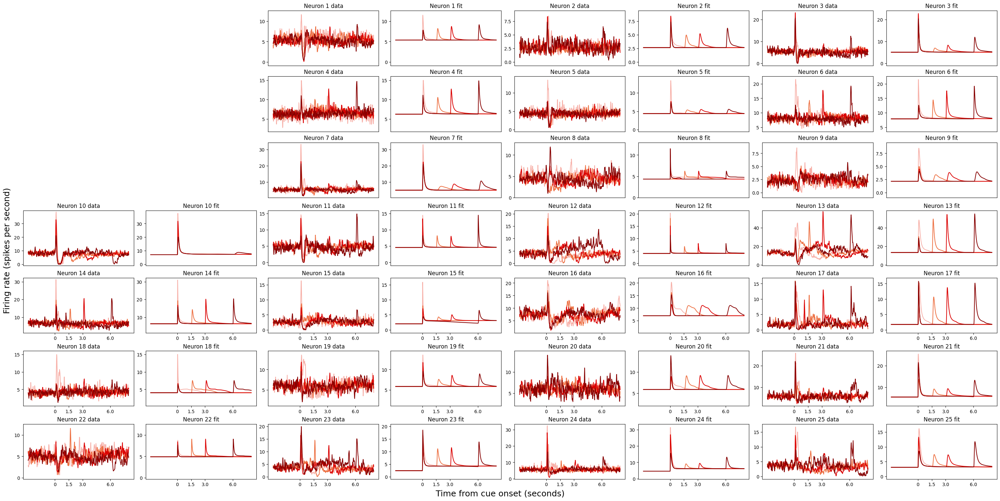

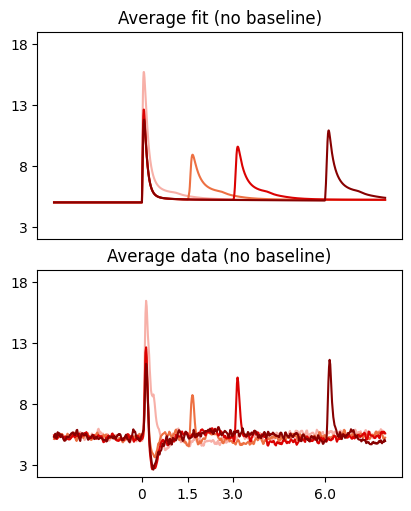

In [11]:
plot_all_neurons(simple_params, neurons, raw_df, "no-baseline_fits.svg", "avg_no-baseline.svg", avg_description=" (no baseline)", baseline=False)

In [10]:
discounting_model_test(simple_params, baseline=False)

(np.float64(1.5974044799804688e-05), np.float64(2.9802322387695312e-08))

In [8]:
sousa_R2(simple_params, raw_df, neurons, baseline=False)

(0.6853377164149799,
 np.float64(60369.14779862794),
 0.9612216298488795,
 np.float64(252.96261407257614))

## Fits without sensory processing

In [4]:
num_seeds = 10 # run the optimization ten times and choose the best result
cand_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed, baseline=False, skip_sensory=True) for i in range(neurons.shape[0]))

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [5]:
results = [] # optimization result
errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the ten optimization runs
    min_error = wrap_simulate_sousa(cand_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True)
    min_result = cand_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True)
        if cur_error < min_error:
            min_result = cand_results[cur_seed][i]
            min_error = cur_error

    results.append(min_result)
    errors.append(min_error)

In [6]:
params = [results[i]["min_res"].x for i in range(len(results))]

with open("fits/saved_params_no-sensory.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_no-sensory.pkl", "wb") as errors_file:
    pickle.dump(errors, errors_file) 

In [9]:
with open("fits/saved_params_no-sensory.pkl", "rb") as paramfile:
    no_sensory_params = pickle.load(paramfile)
    
with open("fits/saved_errors_no-sensory.pkl", "rb") as errorfile:
    no_sensory_errors = pickle.load(errorfile)

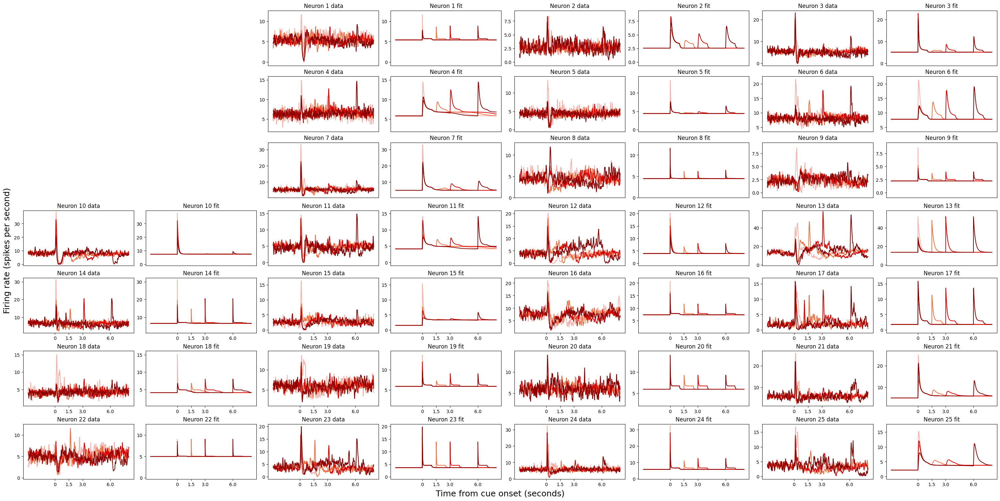

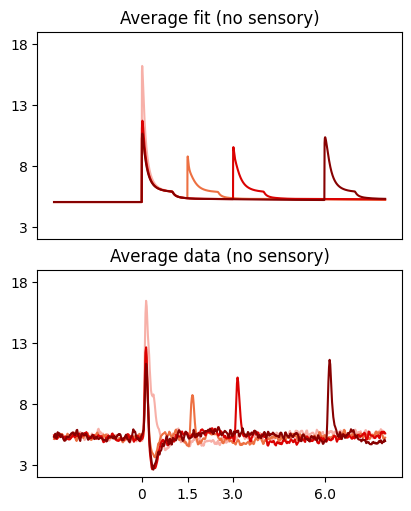

In [14]:
plot_all_neurons(no_sensory_params, neurons, raw_df, "no-sensory_fits.svg", "avg_no-sensory.svg", avg_description=" (no sensory)", baseline=False, skip_sensory=True)


In [12]:
discounting_model_test(no_sensory_params, baseline=False, skip_sensory=True)

(np.float64(7.539987564086914e-06), np.float64(0.00045112731724624274))

In [10]:
sousa_R2(no_sensory_params, raw_df, neurons, baseline=False, skip_sensory=True)

(0.6252160982181616,
 np.float64(69880.96875085507),
 0.9562202135266057,
 np.float64(277.2245328658116))

## Fits with constrained weights

In [4]:
num_seeds = 10 # run the optimization ten times and choose the best result
cand_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed, baseline=False, skip_sensory=True, constrain_W=True) for i in range(neurons.shape[0]))
    cand_results.append(cur_results)

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [6]:
results = [] # optimization result
errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the ten optimization runs
    min_error = wrap_simulate_sousa(cand_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True, constrain_W=True)
    min_result = cand_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True, constrain_W=True)
        if cur_error < min_error:
            min_result = cand_results[cur_seed][i]
            min_error = cur_error

    results.append(min_result)
    errors.append(min_error)

In [7]:
params = [results[i]["min_res"].x for i in range(len(results))]

with open("fits/saved_params_no-sensory_constrain-W.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_no-sensory_constrain-W.pkl", "wb") as errors_file:
    pickle.dump(errors, errors_file) 

In [11]:
with open("fits/saved_params_no-sensory_constrain-W.pkl", "rb") as paramfile:
    no_sensory_W_params = pickle.load(paramfile)
    
with open("fits/saved_errors_no-sensory_constrain-W.pkl", "rb") as errorfile:
    no_sensory_W_errors = pickle.load(errorfile)

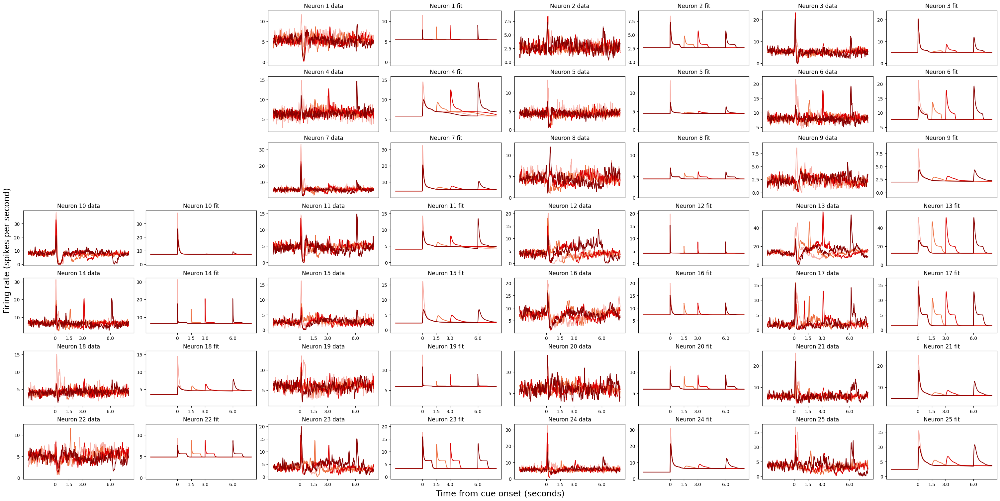

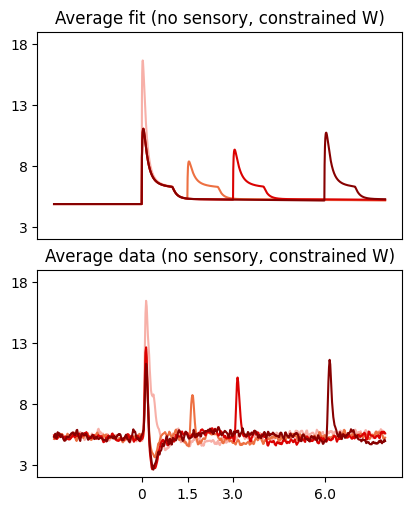

In [16]:
plot_all_neurons(no_sensory_W_params, neurons, raw_df, "no-sensory_constrain-W_fits.svg", "avg_no-sensory_constrain-W.svg", avg_description=" (no sensory, constrained W)", baseline=False, skip_sensory=True, constrain_W=True)


In [20]:
discounting_model_test(no_sensory_W_params, baseline=False, skip_sensory=True, constrain_W=True)

(np.float64(2.9802322387695312e-08), np.float64(1.2814998626708984e-06))

In [12]:
sousa_R2(no_sensory_W_params, raw_df, neurons, baseline=False, skip_sensory=True, constrain_W=True)

(0.602386375949868,
 np.float64(73091.7028736102),
 0.9343511797759725,
 np.float64(352.25401588092757))

## Fits with no suppression

In [4]:
num_seeds = 10 # run the optimization ten times and choose the best result
cand_results = []

for cur_seed in range(num_seeds):
    cur_results = []
    with Parallel(n_jobs=-1) as fitting:
        cur_results = fitting(delayed(fit_neuron)(neurons[i], raw_df, seed=cur_seed, baseline=False, skip_sensory=True, suppress=False) for i in range(neurons.shape[0]))
    cand_results.append(cur_results)

bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should not be too close. Moving plausible bounds.
bads:TooCloseBounds: For each variable, hard and plausible bounds should

In [6]:
results = [] # optimization result
errors = [] # optimization loss

for i in range(neurons.shape[0]): # for each neuron, select the best of the ten optimization runs
    min_error = wrap_simulate_sousa(cand_results[0][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True, suppress=False)
    min_result = cand_results[0][i]

    for cur_seed in range(1, num_seeds):
        cur_error = wrap_simulate_sousa(cand_results[cur_seed][i]["min_res"].x, get_psth(raw_df, neurons[i]), baseline=False, skip_sensory=True, suppress=False)
        if cur_error < min_error:
            min_result = cand_results[cur_seed][i]
            min_error = cur_error

    results.append(min_result)
    errors.append(min_error)

In [7]:
params = [results[i]["min_res"].x for i in range(len(results))]

with open("fits/saved_params_no-suppression.pkl", "wb") as params_file:
    pickle.dump(params, params_file) 

with open("fits/saved_errors_no-suppression.pkl", "wb") as errors_file:
    pickle.dump(errors, errors_file) 

In [13]:
with open("fits/saved_params_no-suppression.pkl", "rb") as paramfile:
    no_suppression_params = pickle.load(paramfile)
    
with open("fits/saved_errors_no-suppression.pkl", "rb") as errorfile:
    no_suppression_errors = pickle.load(errorfile)

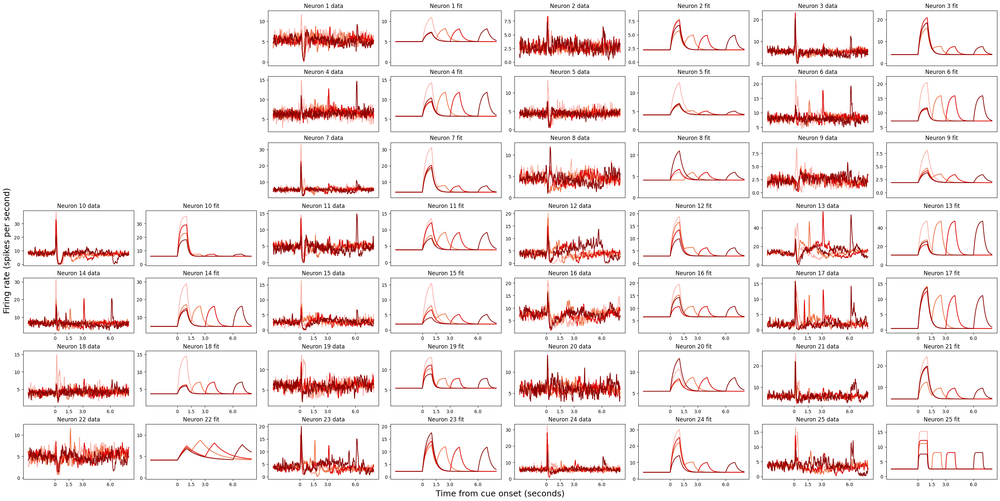

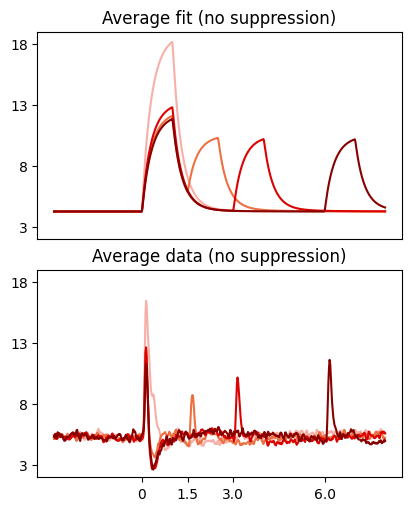

In [22]:
plot_all_neurons(no_suppression_params, neurons, raw_df, "no-suppression.svg", "avg_no-suppression.svg", avg_description=" (no suppression)", baseline=False, skip_sensory=True, suppress=False)


In [21]:
discounting_model_test(no_suppression_params, baseline=False, skip_sensory=True, suppress=False)

(np.float64(0.9999999403953552), np.float64(0.9999999701976776))

In [14]:
sousa_R2(no_suppression_params, raw_df, neurons, baseline=False, skip_sensory=True, suppress=False)

(-0.4393108504696035,
 np.float64(143077.98240848753),
 0.9398695779290536,
 np.float64(338.6932707688148))

## Variable-reward simulations

In [24]:
# load model parameters from the Sousa et al. fits
with open("fits/saved_params_actual.pkl", "rb") as param_file:
    params = pickle.load(param_file)

# initialize task parameters
dt_psth = 20
dt = 4
np.random.seed(0)
rwd_durs = np.array([4, 12, 25, 45, 75, 140, 250])
rwd_vols = np.array([.1, .3, 1.2, 2.5, 5, 10, 20])
cue_onset = 244*dt_psth//dt
cue_offset = 294*dt_psth//dt
rwd_onset = 294*dt_psth//dt + 500//dt
rwd_win_offset = rwd_onset + 600//dt

In [4]:
# responses for each neuron
nt = 644*dt_psth//dt
firing_rates = np.zeros((len(params), 7, 2, nt))

for param_i in range(len(params)):
    for rwd_i, rwd in enumerate(rwd_durs):
            for cue_i, cue in enumerate([0, 1]):
                r3 = wrap_simulate_eshel(params[param_i], testcue=cue, testrwd_dur=rwd)
                firing_rates[param_i, rwd_i, cue_i, :] = r3 

In [5]:
# fit Eshel et al. discrete models to the unexpected responses
unexpec_params = []

for param_i in range(len(params)):
    responses = []
    cues = []
    rwds = []
    for rwd_i in range(len(rwd_durs)):
        r3 = firing_rates[param_i, rwd_i, 0, :]#wrap_simulate_eshel(params[param_i], testcue=0, testrwd_dur=rwd)
        cur_baseline = r3[rwd_onset-1000//dt:rwd_onset].mean() 
        responses.append(r3[rwd_onset:rwd_win_offset].mean() - cur_baseline)
    
    unexpec_params.append(minimize(unexpec_resp_mse, (1, 1), args=(rwd_vols, responses), method="L-BFGS-B", bounds=[(0, np.inf), (0, np.inf)]).x)

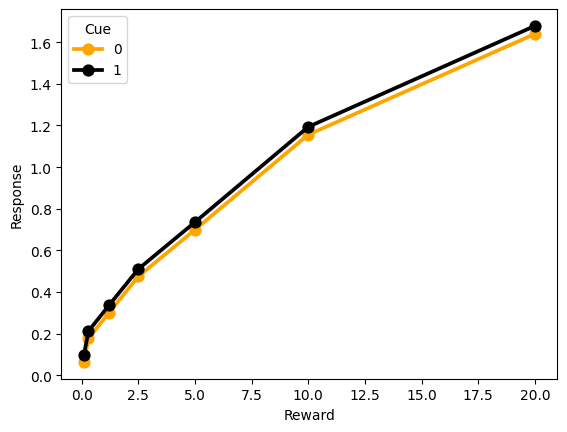

neuron 1 -- IN SUB
OUT SUB better than out div
coef -0.0002128812078658711


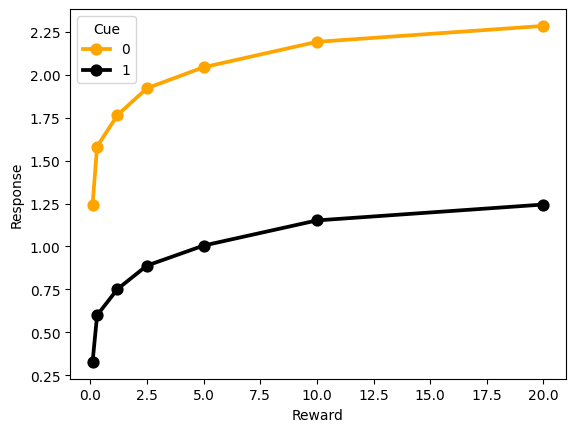

neuron 2 -- OUT SUB
OUT SUB better than out div
coef 0.0035793623607282845


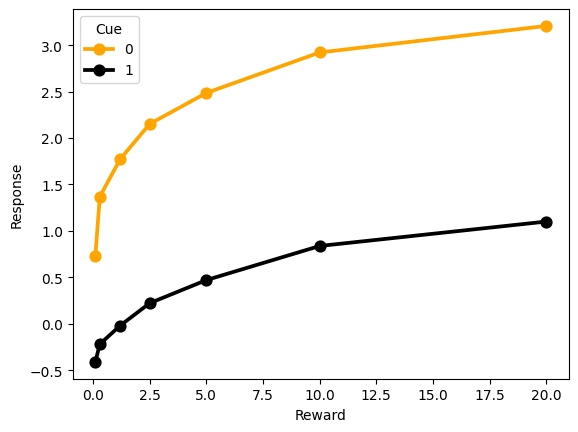

neuron 3 -- IN DIV
OUT SUB better than out div
coef 0.03154375755982644


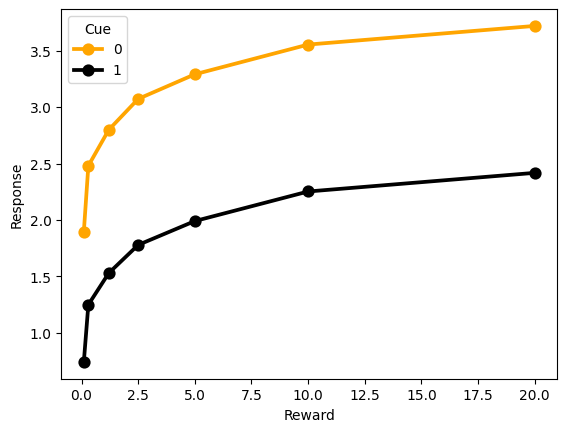

neuron 4 -- OUT SUB
OUT SUB better than out div
coef 0.004310031970211618


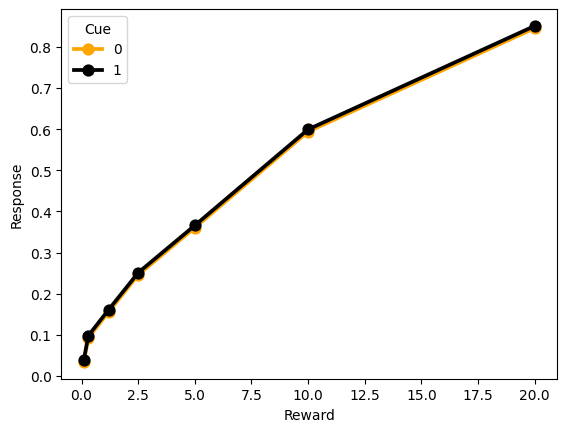

neuron 5 -- IN SUB
OUT SUB better than out div
coef -1.1277752383900725e-05


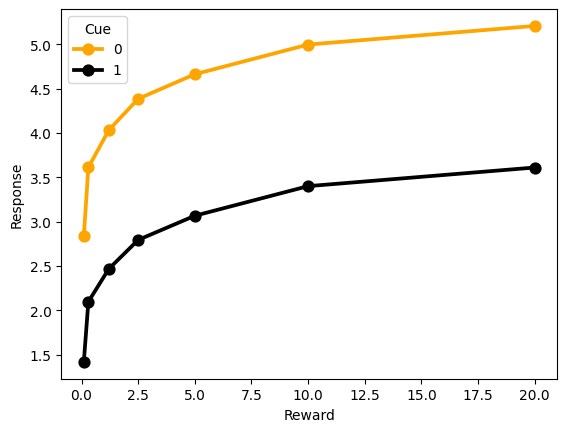

neuron 6 -- OUT SUB
OUT SUB better than out div
coef 0.004966136412816667


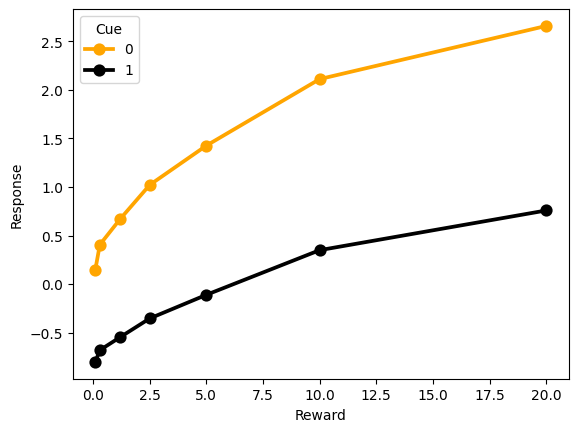

neuron 7 -- OUT SUB
OUT SUB better than out div
coef 0.04365039051121013


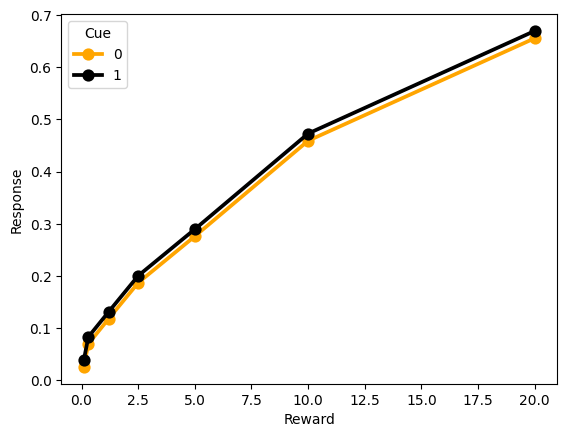

neuron 8 -- IN SUB
OUT SUB better than out div
coef -4.2890999704786703e-05


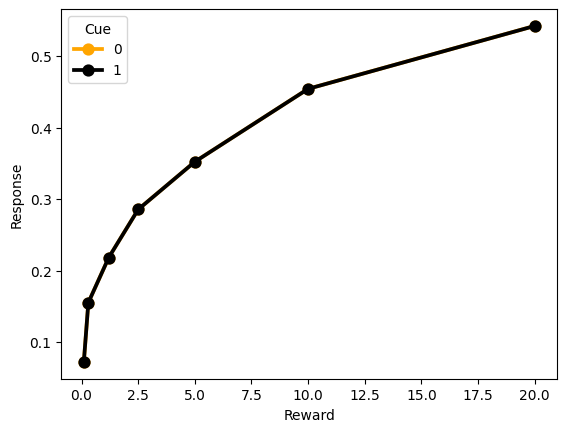

neuron 9 -- IN SUB
OUT SUB better than out div
coef -9.977527727629425e-08


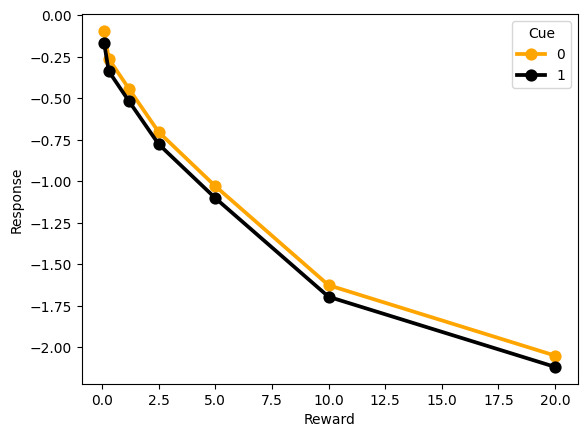

neuron 10 -- OUT SUB
OUT SUB better than out div
coef -0.0003690048935961127


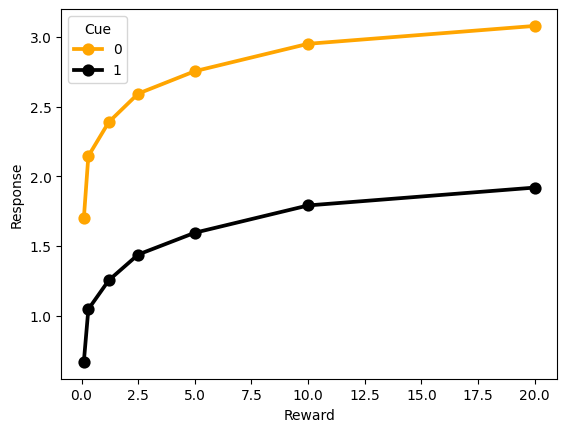

neuron 11 -- OUT SUB
OUT SUB better than out div
coef 0.0037019105039726935


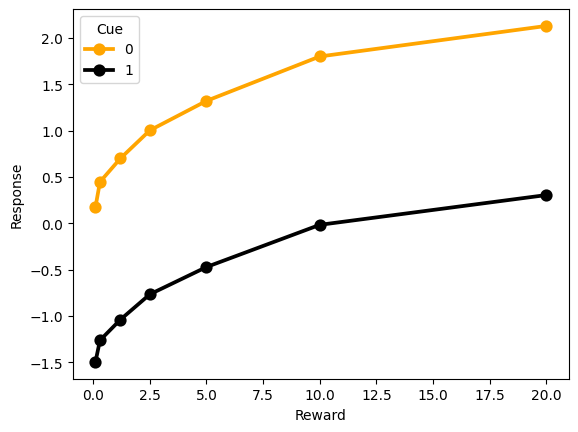

neuron 12 -- OUT SUB
OUT SUB better than out div
coef 0.006318152448325335


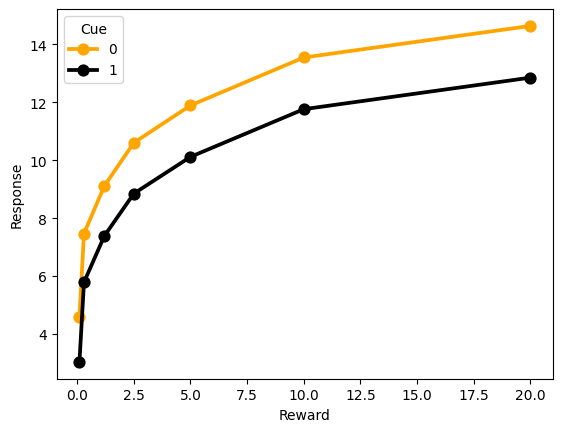

neuron 13 -- IN DIV
OUT SUB better than out div
coef 0.006729995293665886


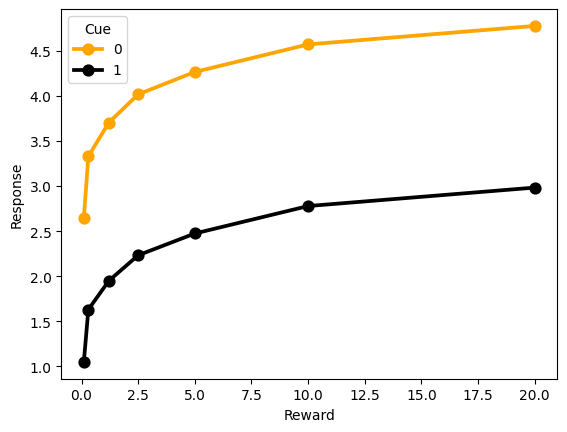

neuron 14 -- OUT SUB
OUT SUB better than out div
coef 0.005674314392376409


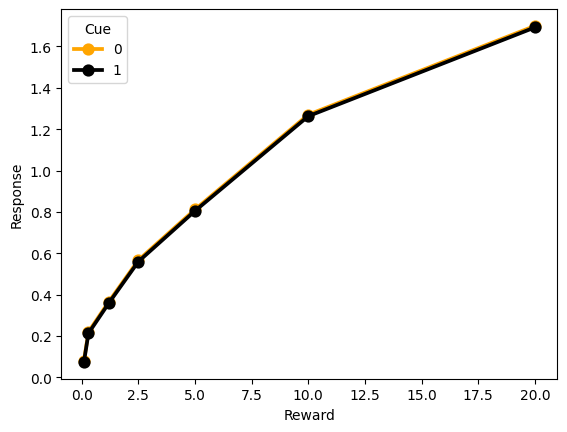

neuron 15 -- IN SUB
OUT SUB better than out div
coef 4.678709872084058e-05


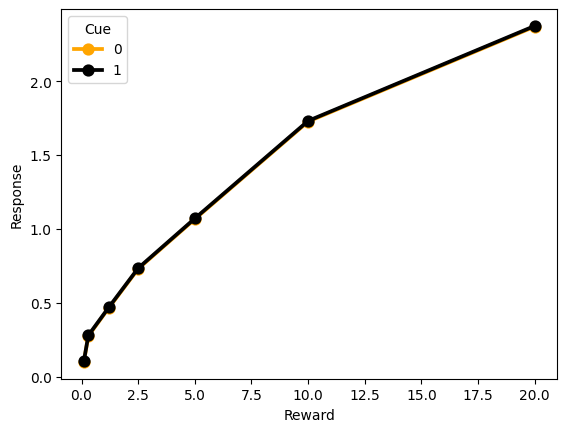

neuron 16 -- IN SUB
OUT SUB better than out div
coef -3.5623757013145956e-05


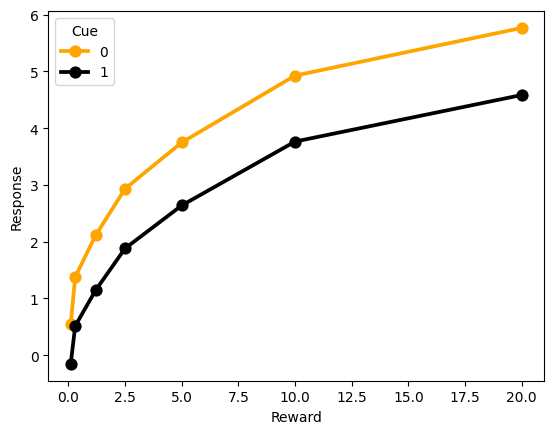

neuron 17 -- OUT SUB
OUT SUB better than out div
coef 0.01786550284783482


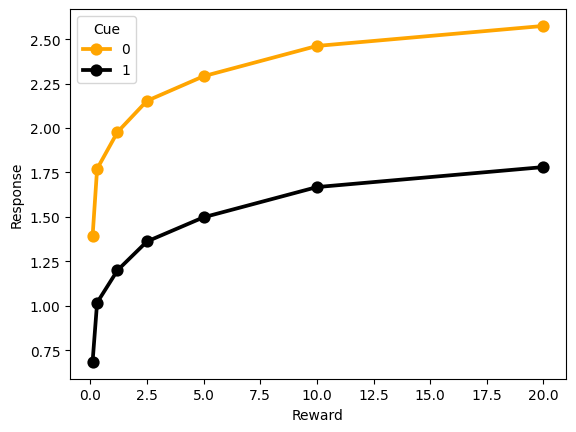

neuron 18 -- OUT SUB
OUT SUB better than out div
coef 0.002472380042807754


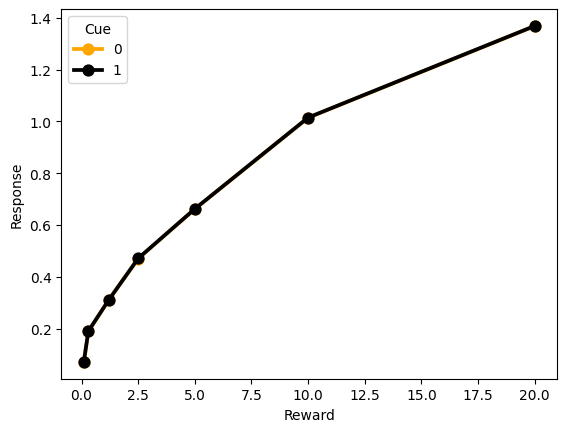

neuron 19 -- IN SUB
OUT SUB better than out div
coef -1.9729920989817293e-06


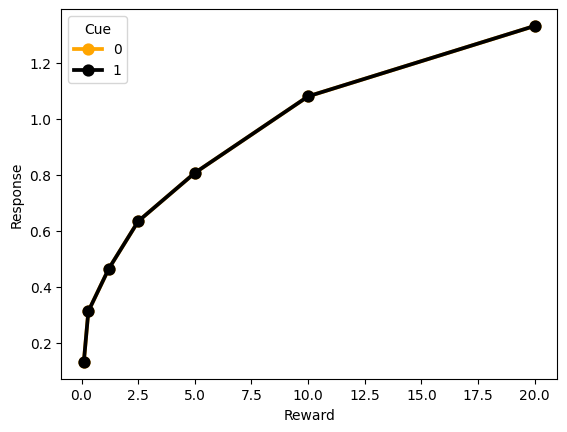

neuron 20 -- IN SUB
OUT SUB better than out div
coef -4.6435220077607487e-07


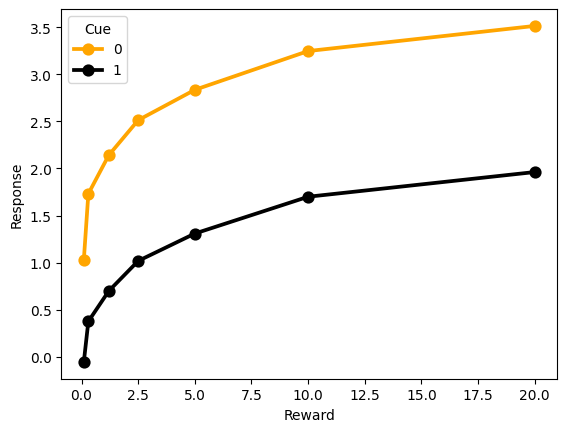

neuron 21 -- IN DIV
OUT SUB better than out div
coef 0.013541435412326688


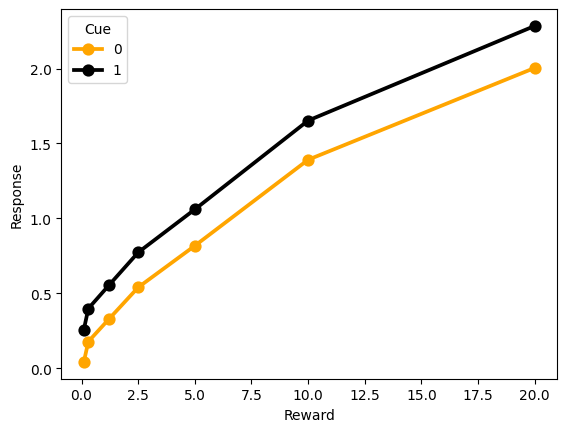

neuron 22 -- OUT SUB
OUT SUB better than out div
coef -0.0031681158455123177


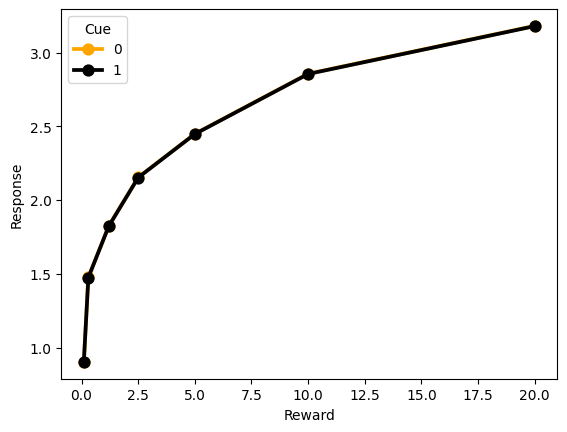

neuron 23 -- IN SUB
OUT SUB better than out div
coef 1.5081896203483578e-06


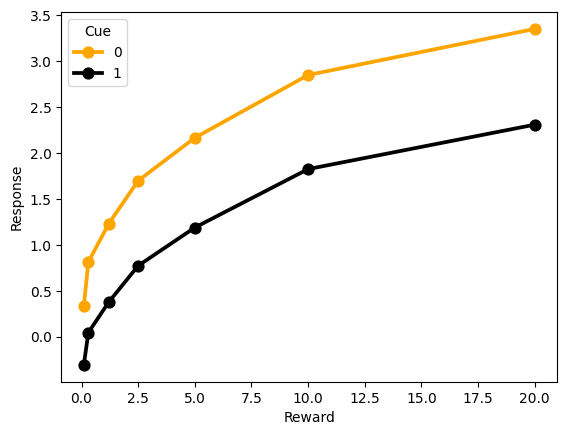

neuron 24 -- OUT SUB
OUT SUB better than out div
coef 0.015295857440529262


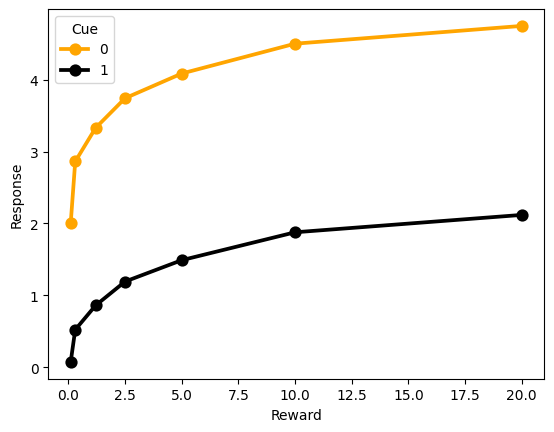

neuron 25 -- IN DIV
OUT SUB better than out div
coef 0.020066624714767434


In [6]:
coefs = []
sub_mse = []
sub_mse_all4 = []
div_mse = []
div_mse_all4 = []
all_responses = np.zeros(14)
individual_responses = []
cues = np.array([0, 1] * 7)
rwds = np.repeat(rwd_vols, 2)

for param_i in range(len(params)):
    responses = []

    # simulate responses for each cue-reward combination
    for rwd_i in range(len(rwd_durs)):#rwd in rwd_durs:
        for cue_i in [0, 1]:
            r3 = firing_rates[param_i, rwd_i, cue_i, :]
            if cue == 0:
                cur_baseline = r3[rwd_onset-1000//dt:rwd_onset].mean()
            else:
                cur_baseline = r3[cue_onset-1000//dt:cue_onset].mean()
            responses.append(r3[rwd_onset:rwd_win_offset].mean() - cur_baseline)

    # graph
    diff_df = pd.DataFrame({"Cue": cues, "Reward": rwds, "Response": responses})
    ax = sns.pointplot(diff_df, x="Reward", y="Response", hue="Cue", palette=["orange", "black"], native_scale=True)
    plt.show()
    
    responses = np.array(responses)

    # fit Eshel et al. discrete models
    sigma, f = unexpec_params[param_i]
    args = (sigma, f, cues, rwds, responses)
    out_sub_E = minimize(out_sub_mse, 0, args=args, method="L-BFGS-B", bounds=[(-np.inf, np.inf)]).x
    out_div_E = minimize(out_div_mse, 1, args=args, method="L-BFGS-B", bounds=[(0, np.inf)]).x
    in_sub_E = minimize(in_sub_mse, 0, args=args, method="L-BFGS-B", bounds=[(-np.inf, .1)]).x # upper bound min(rwd_vols) = .1 to avoid square root of negative number
    in_div_E = minimize(in_div_mse, 1, args=args, method="L-BFGS-B", bounds=[(0, np.inf)]).x
    model_results = [out_sub_mse(out_sub_E, *args), out_div_mse(out_div_E, *args), in_sub_mse(in_sub_E, *args), in_div_mse(in_div_E, *args)]
    best = ["OUT SUB", "OUT DIV", "IN SUB", "IN DIV"][np.argmin(model_results)]
    print("neuron", param_i + 1, "--", best)
    if model_results[0] < model_results[1]:
        print("OUT SUB better than out div")
    else:
        print("OUT DIV better than out sub")
    sub_mse.append(model_results[0])
    sub_mse_all4.append(min(model_results[0], model_results[2]))
    div_mse.append(model_results[1])
    div_mse_all4.append(min(model_results[1], model_results[3]))

    # prediction error slope
    cur_diffs = responses[::2] - responses[1::2] 
    coef = LinearRegression().fit(rwds[::2].reshape(-1, 1).reshape(-1, 1), cur_diffs).coef_[0]
    print("coef", coef)
    coefs.append(coef)
    all_responses += responses
    individual_responses.append(responses)

In [7]:
wilcoxon(sub_mse, div_mse)

WilcoxonResult(statistic=np.float64(0.0), pvalue=np.float64(5.960464477539063e-08))

In [8]:
wilcoxon(sub_mse_all4, div_mse_all4)

WilcoxonResult(statistic=np.float64(71.0), pvalue=np.float64(0.012466490268707275))

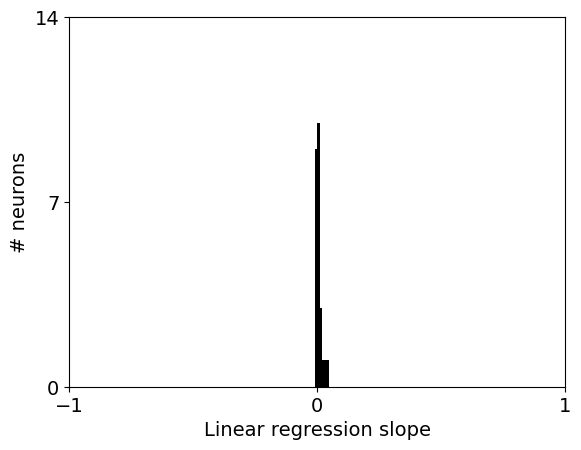

(np.float64(0.007036872624963498), np.float64(0.01096376997311063))

In [14]:
# histogram of slopes
plt.hist(np.array(coefs), bins=np.arange(0, 100)/100-.5, color="k")
plt.xlim(-1, 1)
plt.xticks([-1, 0, 1], fontsize=14)
plt.yticks([0, 7, 14], fontsize=14)
plt.xlabel("Linear regression slope", fontsize=14)
plt.ylabel("# neurons", fontsize=14)
plt.savefig("slope_hist.svg", bbox_inches="tight")
plt.show()
np.mean(coefs), np.std(coefs)

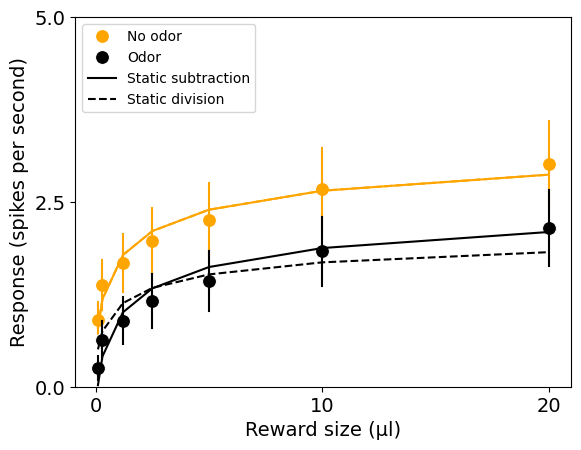

In [10]:
# fit discrete models for population responses
responses_df = pd.DataFrame({"Response": np.array(individual_responses).reshape(-1), "Reward": np.tile(rwds, 25), "Cue": np.tile(["Unexpected", "Expected"], 7 * 25)})
responses = np.array(individual_responses).mean(axis=0)[::2]
sigma, f = minimize(unexpec_resp_mse, (1, 1), args=(rwd_vols, responses), method="L-BFGS-B", bounds=[(0, np.inf), (0, np.inf)]).x
responses = np.array(individual_responses).mean(axis=0)
cues = np.array([0, 1] * 7)
rwds = np.repeat(rwd_vols, 2)
sub_pop_E = minimize(out_sub_mse, 0, args=(sigma, f, cues, rwds, responses), method="L-BFGS-B", bounds=[(-np.inf, np.inf)]).x
div_pop_E = minimize(out_div_mse, 1, args=(sigma, f, cues, rwds, responses), method="L-BFGS-B", bounds=[(0, np.inf)]).x

# graph discrete models
sub_resp_list = []
div_resp_list = []
for rwd in rwd_vols:
    for cue in [0, 1]:
        sub_resp_list.append(out_sub_resp(sigma, f, sub_pop_E, cue, rwd)[0]) # subscript needed?
        div_resp_list.append(out_div_resp(sigma, f, div_pop_E, cue, rwd)[0])

sub_df = pd.DataFrame({"Response": sub_resp_list, "Reward": rwds, "Cue": cues})
div_df = pd.DataFrame({"Response": div_resp_list, "Reward": rwds, "Cue": cues})

ax = sns.lineplot(responses_df, x="Reward", y="Response", hue="Cue", palette=["orange", "black"], errorbar="se", err_style="bars", marker="o", linestyle="", markersize=10)
sns.lineplot(sub_df, x="Reward", y="Response", hue="Cue", palette=["orange", "black"], marker="", ax=ax)
sns.lineplot(div_df, x="Reward", y="Response", hue="Cue", palette=["orange", "black"], marker="", linestyle="dashed", ax=ax)
handles, labels = ax.get_legend_handles_labels()
ax.legend([handles[0], handles[1], handles[3], handles[5]], ["No odor", "Odor", "Static subtraction", "Static division"], loc="upper left")
#sns.move_legend(ax, "best", title="")
plt.ylim(0, 5)
plt.xticks([0, 10, 20], fontsize=14)
plt.yticks([0, 2.5, 5], fontsize=14)
plt.xlabel("Reward size (μl)", fontsize=14)
plt.ylabel("Response (spikes per second)", fontsize=14)
plt.savefig("sub_div.svg", bbox_inches="tight")
plt.show()

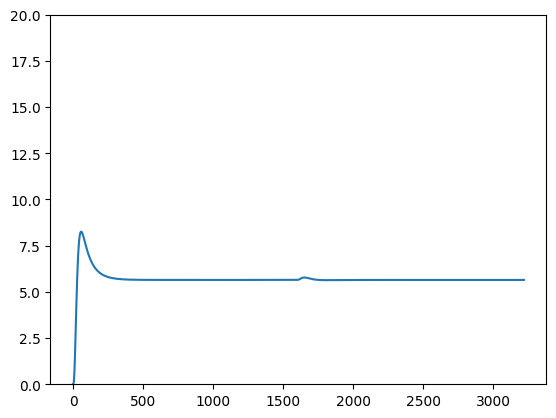

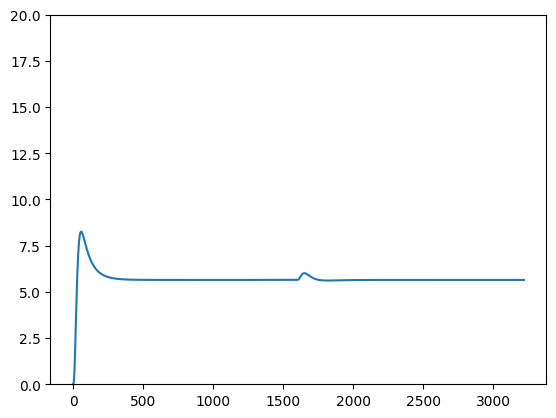

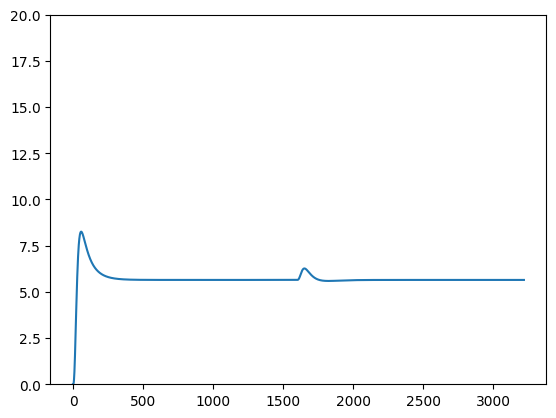

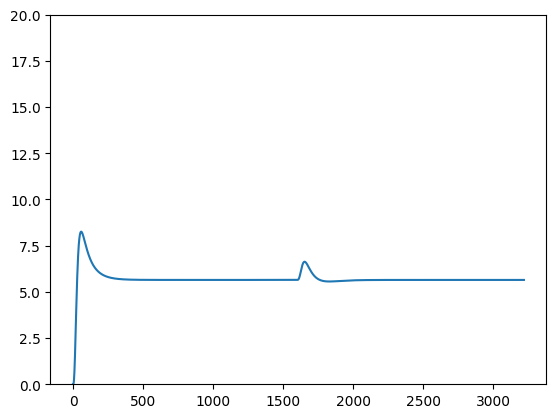

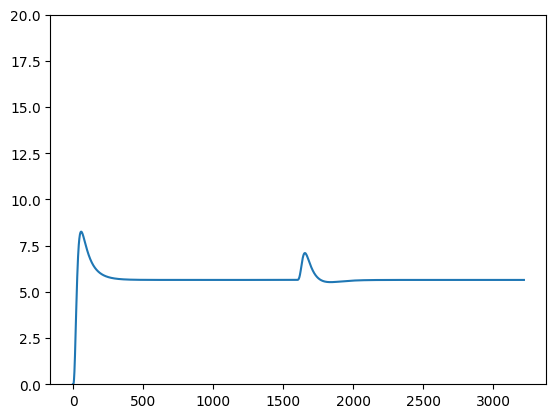

...

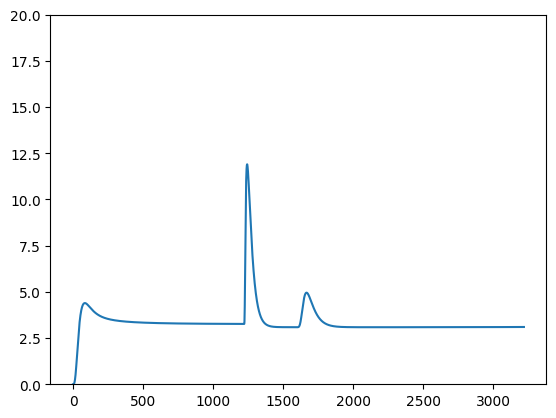

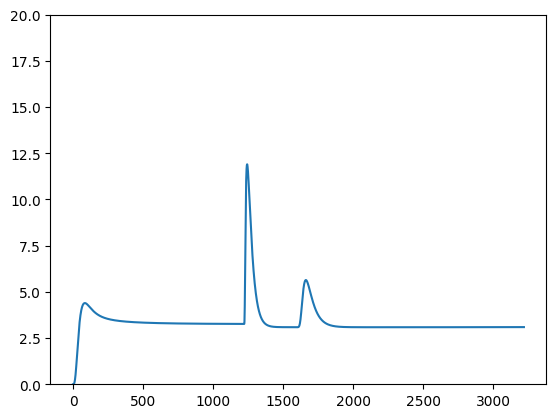

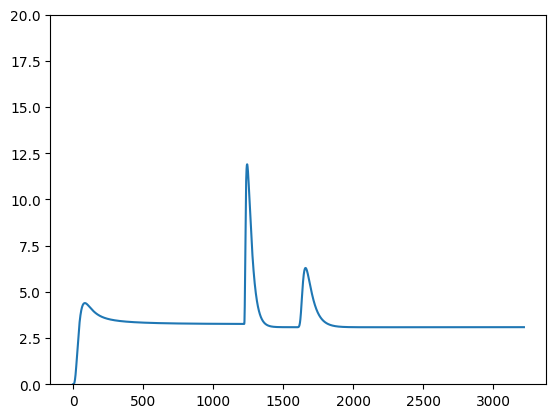

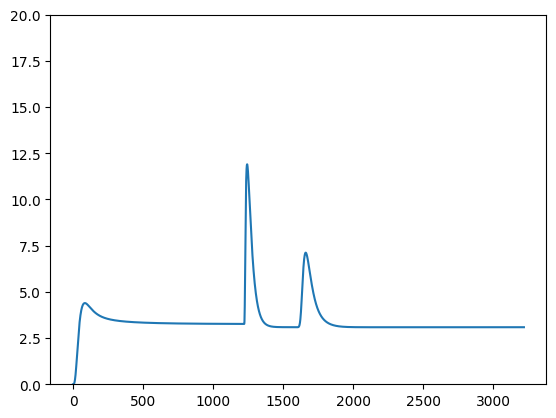

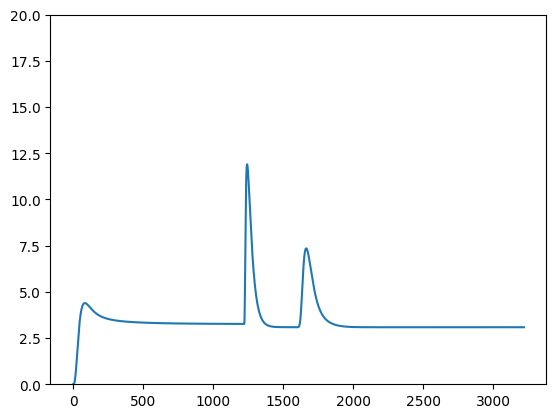

In [40]:
# temporal dynamics for all neurons
for param_i in range(len(params)):
    cur_firing_rates = []
    
    for cue_i in [0, 1]:
        for rwd_i in range(len(rwd_durs)):
            r3 = firing_rates[param_i, rwd_i, cue_i, :]
            cur_firing_rates.append(r3)
            plt.plot(range(r3.shape[0]), r3)
            plt.ylim(0, 20)
            plt.show()

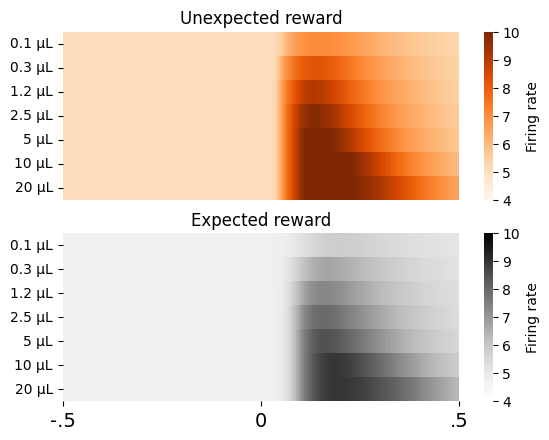

In [20]:
fig, (ax1, ax2) = plt.subplots(2, 1)
sns.heatmap(firing_rates[:, :, 0, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=0), cmap="Oranges", ax=ax1, vmin=4, vmax=10, cbar_kws={"label": "Firing rate"}, yticklabels=["0.1 μL", "0.3 μL", "1.2 μL", "2.5 μL", "5 μL", "10 μL", "20 μL"])
ax1.set_xticks([])
ax1.set_title("Unexpected reward")
sns.heatmap(firing_rates[:, :, 1, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=0), cmap="Greys", ax=ax2, vmin=4, vmax=10, cbar_kws={"label": "Firing rate"}, yticklabels=["0.1 μL", "0.3 μL", "1.2 μL", "2.5 μL", "5 μL", "10 μL", "20 μL"])
ax2.set_xticks([0, 500//dt, 1000//dt], labels=["-.5", "0", ".5"], fontsize=14, rotation=0)
ax2.set_title("Expected reward")
plt.savefig("eshel_temporal.svg", bbox_inches="tight")
plt.show()

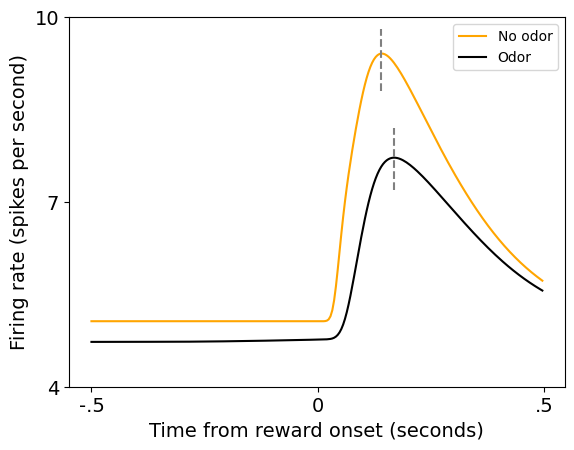

In [24]:
plt.plot(np.arange(1000//dt), firing_rates[:, :, 0, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=(0, 1)), color="orange", label="No odor")
plt.vlines(firing_rates[:, :, 0, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=(0, 1)).argmax(), 8.8, 9.8, color="grey", linestyle="dashed")
plt.plot(np.arange(1000//dt), firing_rates[:, :, 1, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=(0, 1)), color="black", label="Odor")
plt.vlines(firing_rates[:, :, 1, rwd_onset-500//dt:rwd_onset+500//dt].mean(axis=(0, 1)).argmax(), 7.2, 8.2, color="grey", linestyle="dashed")
plt.xticks([0, 500//dt, 1000//dt], labels=["-.5", "0", ".5"], fontsize=14)
plt.yticks([5, 10])
plt.ylim(4, 10)
plt.yticks([4, 7, 10], fontsize=14)
plt.xlabel("Time from reward onset (seconds)", fontsize=14)
plt.ylabel("Firing rate (spikes per second)", fontsize=14)
plt.legend()
plt.savefig("eshel_responses.svg", bbox_inches="tight")
plt.show()